In [1]:
from transformers import AutoTokenizer, AutoModel
import torch
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
import copy

c:\Users\lnieb\Desktop\Studium\03_Organisation\24T4\Text Mining und Web Analysis\LGit_TextMining\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
all_party_textes_df = pd.read_parquet("all_parties_text_combined_prep.parquet")
Labled_theses_df = pd.read_parquet("wahlomat_thesen_prep.parquet")
#Labled_theses_df = pd.read_csv('wahlomaten_thesen_positionen.csv')

In [7]:
Labled_theses_df.columns

Index(['These', 'CDU / CSU', 'GRÜNE', 'SPD', 'AfD', 'Die Linke', 'FDP',
       'These_no_stopwords', 'These_lemmatized', 'These_unique_words'],
      dtype='object')

In [5]:
lable_colums_list = Labled_theses_df.columns[1:].tolist()

replace_dict = {
    'spd'   :   'SPD', 
    'cdu'   :   'CDU / CSU', 
    'gruene':   'GRÜNE', 
    'afd'   :   'AfD',
    'fdp'   :   'FDP', 
    'linke' :   'Die Linke'
}

all_party_textes_df['Party'] = all_party_textes_df['Party'].replace(replace_dict)
del replace_dict

In [11]:
parties_list = all_party_textes_df['Party'].unique().tolist()
Labled_theses_list = Labled_theses_df['These_unique_words'].tolist()
predicted_theses_df = copy.deepcopy(Labled_theses_df)

all_party_textes_df['Chapter'] = all_party_textes_df['Chapter'].fillna('-')
all_party_textes_df = all_party_textes_df.dropna()

In [9]:
# Lade das DeBERTa-Modell und den Tokenizer
model_name = "sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

# Funktion zur Berechnung der Embeddings mit DeBERTa
#def get_embedding(text):
#    inputs = tokenizer(text, padding=True, truncation=True, return_tensors="pt")
#    with torch.no_grad():
#        outputs = model(**inputs)
#    return outputs.last_hidden_state[:, 0, :].squeeze().numpy()  # Verwende den CLS-Token als Repräsentation

# Funktion zur Berechnung der Embeddings mit paraphrase-multilingual-MiniLM-L12-v2
def get_embedding(text):
    # Tokenize sentences
    encoded_input = tokenizer(text, padding=True, truncation=True, return_tensors='pt')

    # Compute token embeddings
    with torch.no_grad():
        model_output = model(**encoded_input)

    token_embeddings = model_output[0]
    input_mask_expanded = encoded_input['attention_mask'].unsqueeze(-1).expand(token_embeddings.size()).float()

    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

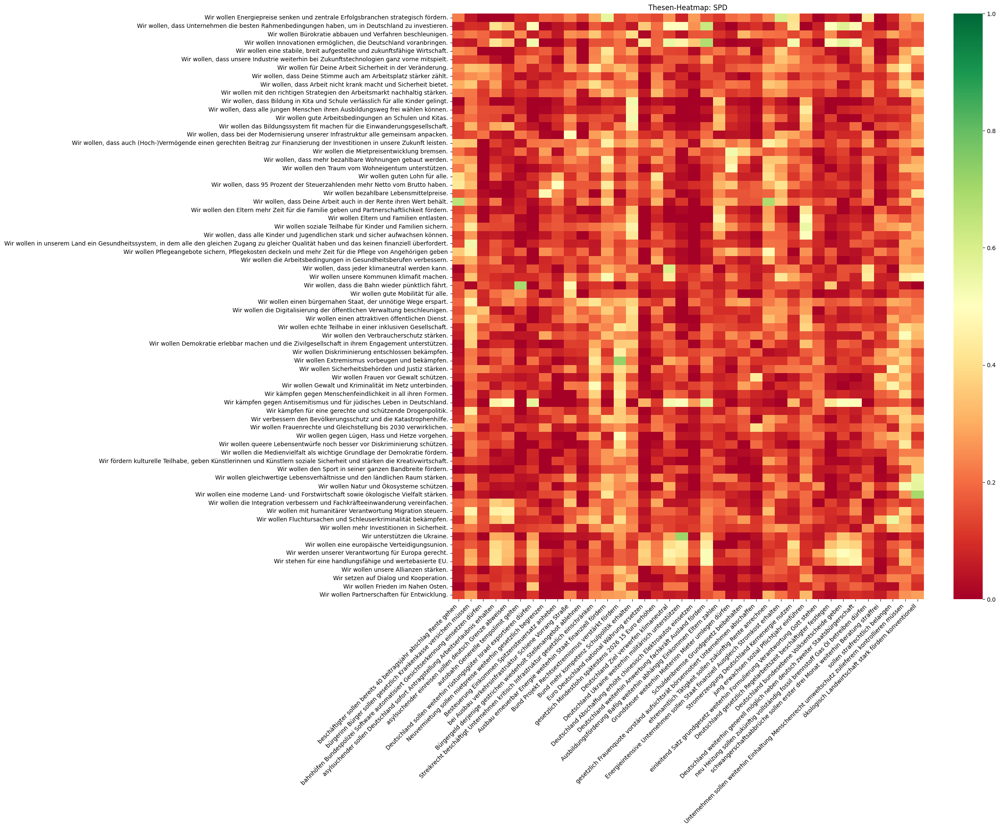

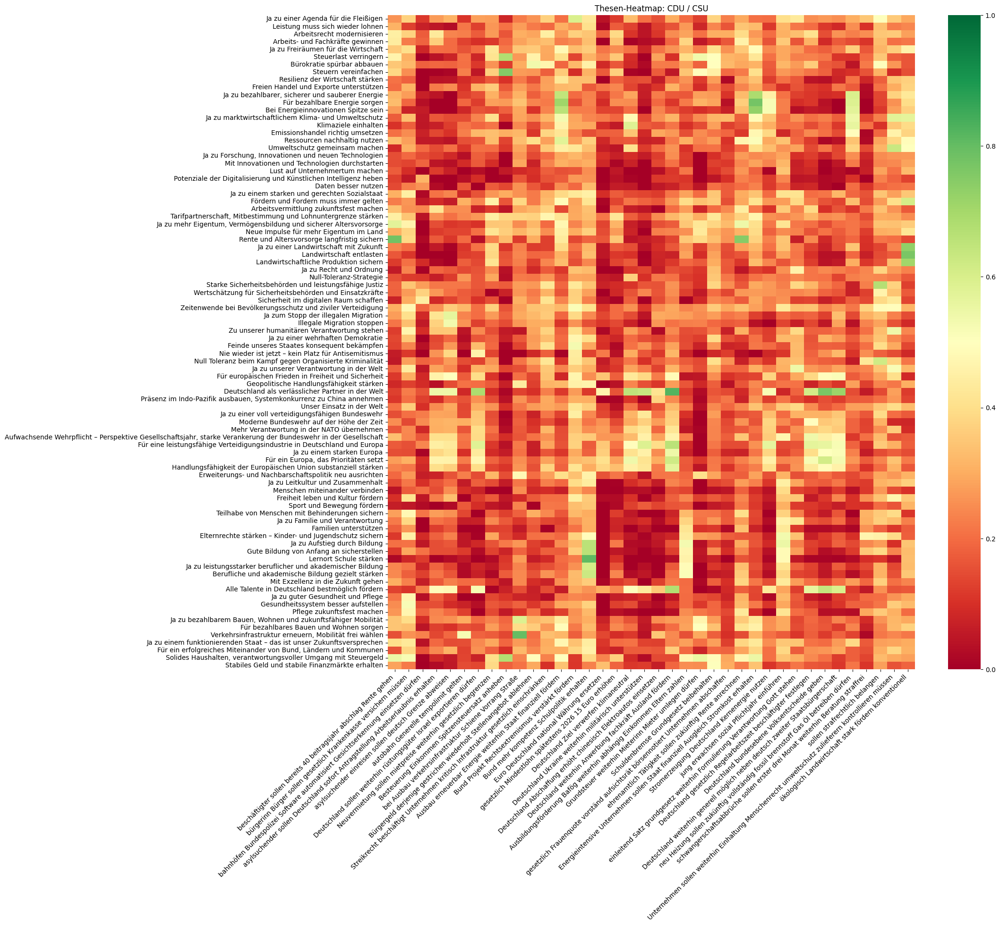

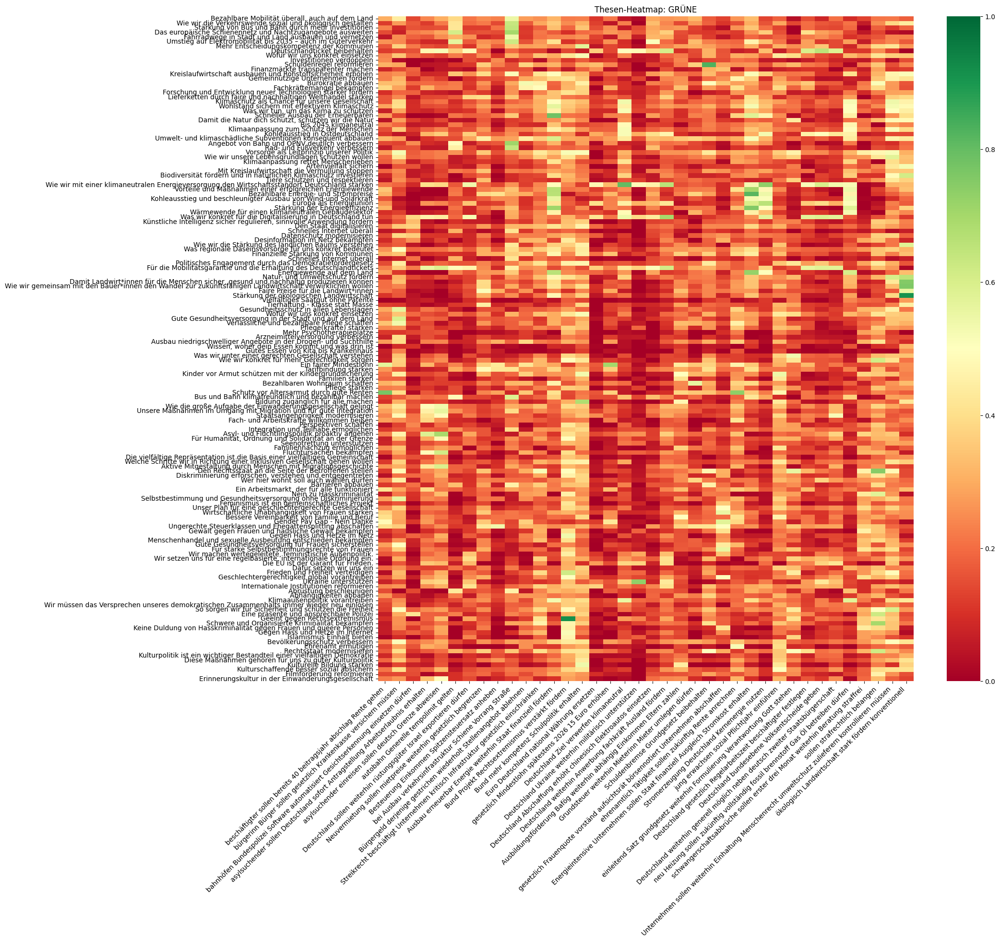

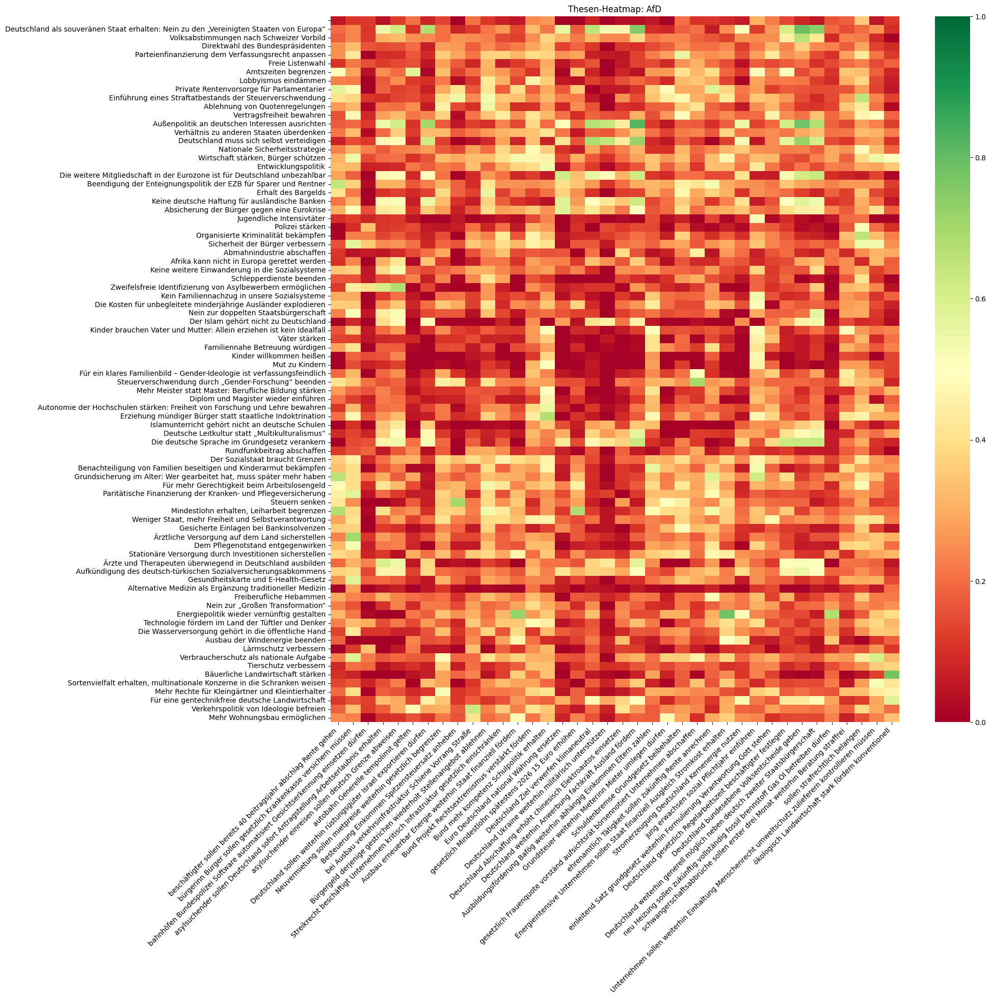

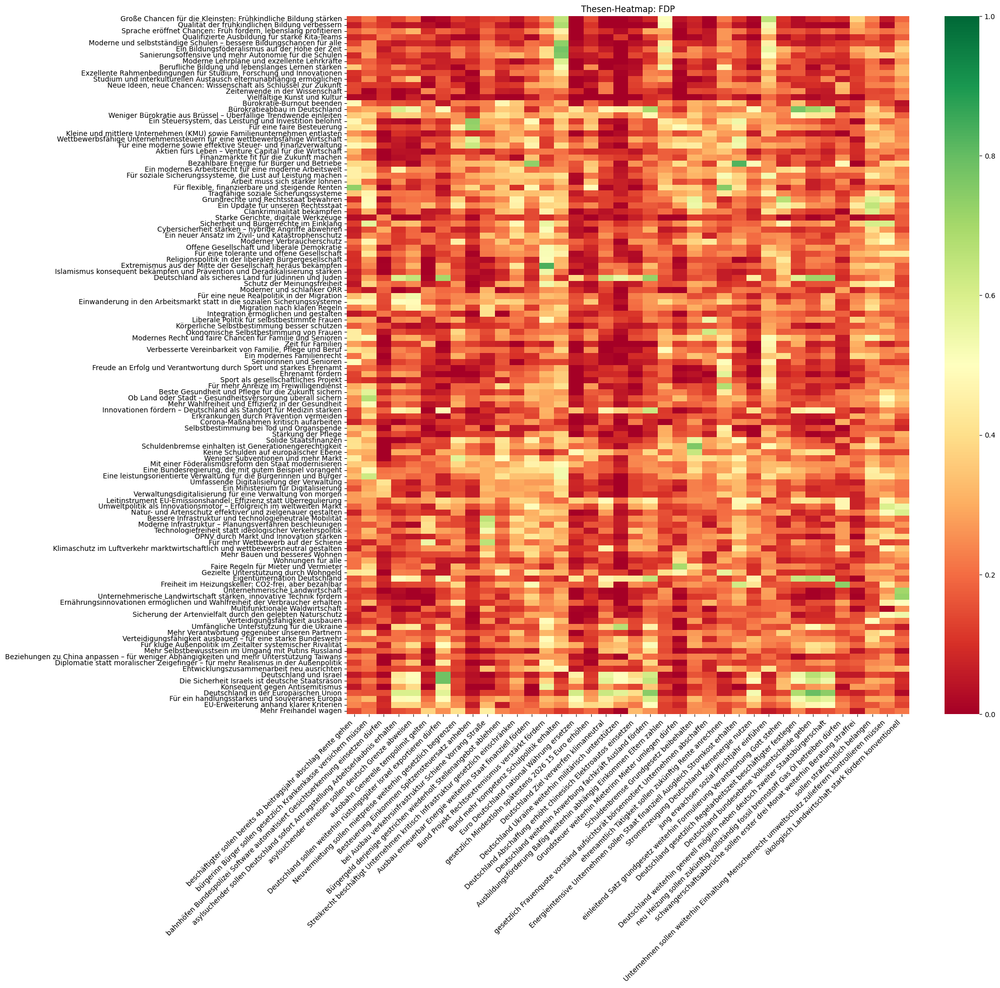

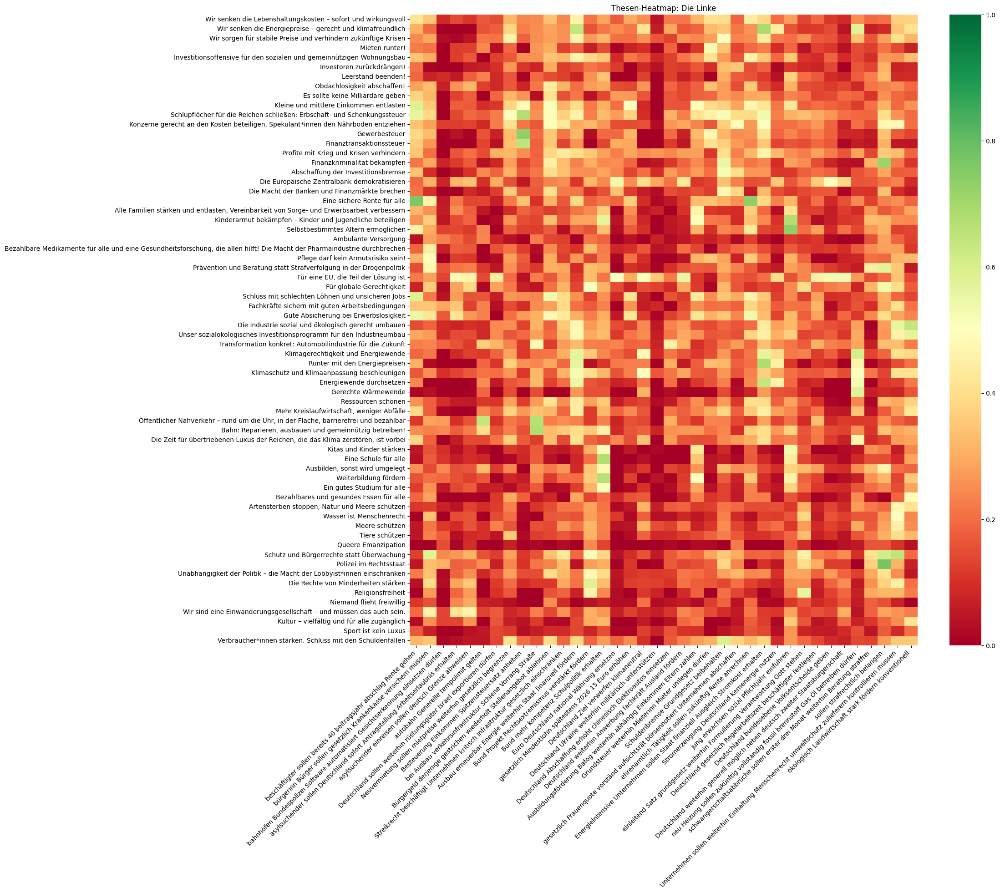

                                               These  CDU / CSU     GRÜNE  \
0  Alle Beschäftigten sollen bereits nach 40 Beit...   0.780834  0.771138   
1  Alle Bürgerinnen und Bürger sollen in gesetzli...   0.521248  0.594866   
2  An Bahnhöfen soll die Bundespolizei Software z...   0.441881  0.415555   
3  Asylsuchende sollen in Deutschland sofort nach...   0.546337  0.587317   
4  Asylsuchende, die über einen anderen EU-Staat ...   0.562730  0.694740   

        SPD       AfD  Die Linke       FDP  \
0  0.654516  0.672328   0.765171  0.733460   
1  0.538996  0.701103   0.575179  0.666665   
2  0.351737  0.403891   0.308362  0.416494   
3  0.456567  0.605898   0.477584  0.600024   
4  0.486914  0.672961   0.461361  0.646222   

                                  These_no_stopwords  \
0  beschäftigten sollen bereits 40 beitragsjahren...   
1  bürgerinnen bürger sollen gesetzlichen kranken...   
2  bahnhöfen bundespolizei software automatisiert...   
3  asylsuchende sollen deutschland s

In [12]:


# Liste der Parteien und Thesen
parties_list = all_party_textes_df['Party'].unique().tolist()
predicted_theses_dfs_dict = {}

# Schleife über die Parteien
for party_str in parties_list:
    # Filtern der Daten für die aktuelle Partei
    party_df = all_party_textes_df[all_party_textes_df['Party'] == party_str]
    
    # Entfernen von Zeilen mit NaN-Werten
    party_df = party_df.dropna()
    
    # Extrahieren der Thesen für die aktuelle Partei
    party_text_list = party_df['These'].to_list()

    # Erstellung eines DataFrames zur Berechnung der Ähnlichkeiten
    similarity_df = pd.DataFrame(columns=['party_these'] + Labled_theses_list)

    # Berechnung der Ähnlichkeit für jede Partei-These
    for party_these in party_text_list:
        party_these_embedding = get_embedding(party_these)
        row = [party_these]

        # Berechnung der Kosinusähnlichkeit für jede labelte These
        for label_these in Labled_theses_list:
            label_these_embedding = get_embedding(label_these)
            similarity_score = (cosine_similarity(party_these_embedding.reshape(1, -1), label_these_embedding.reshape(1, -1))[0][0])
            row.append(similarity_score)

        similarity_df.loc[len(similarity_df)] = row

    # Visualisierung der Ähnlichkeiten als Heatmap
    plt.figure(figsize=(18, 18))
    sns.heatmap(similarity_df[Labled_theses_list],
                cmap='RdYlGn',
                annot=False,
                vmax=1,
                vmin=0,
                yticklabels=similarity_df["party_these"])
    plt.xticks(rotation=45, ha="right")
    plt.title(f"Thesen-Heatmap: {party_str}")
    plt.show()

    # Durchschnittliche Ähnlichkeit für jede Partei
    predicted_theses_dfs_dict[party_str] = similarity_df
    predicted_theses_df[party_str] = similarity_df[Labled_theses_list].max().tolist()
    
# Ausgabe der ersten Zeilen des DataFrames mit den Vorhersagen
print(predicted_theses_df.head())


In [13]:
import os
import pickle


file_name_all_similaritys = f'paraphrase-multilingual-MiniLM-L12-v2_Theses_all_similaritys.pkl' 
file_name_max_similaritys = f'paraphrase-multilingual-MiniLM-L12-v2_Theses_max_similaritys.parquet' 


with open(file_name_all_similaritys, 'wb') as f:
    pickle.dump(predicted_theses_dfs_dict, f)

predicted_theses_df.to_parquet(file_name_max_similaritys, index=False)



In [16]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

def calc_prediction_scores_func(predicted_theses_df:pd.DataFrame, label_these_num_df:pd.DataFrame)->pd.DataFrame:
    scores_df = pd.DataFrame(columns= ['score'])
    scores_df['score'] = ['RMSE', 'MAE', 'R²']
    for col in predicted_theses_df.columns[4:]: 
        predicted_values = predicted_theses_df[col]
        true_values = label_these_num_df[col]

        rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
        r2 = r2_score(true_values, predicted_values)
        mae = mean_absolute_error(true_values, predicted_values)
        scores_df[col] = [rmse, mae, r2]


    return scores_df



In [19]:
label_these_num_df

,These,CDU / CSU,GRÜNE,SPD,AfD,Die Linke,FDP,These_no_stopwords,These_lemmatized,These_unique_words
0,Alle Beschäftigten sollen bereits nach 40 Beit...,stimme nicht zu,stimme nicht zu,stimme nicht zu,0.166667,0.833333,0.166667,NaN,NaN,NaN
1,Alle Bürgerinnen und Bürger sollen in gesetzli...,stimme nicht zu,stimme zu,stimme zu,0.166667,0.833333,0.166667,NaN,NaN,NaN
2,An Bahnhöfen soll die Bundespolizei Software z...,stimme zu,stimme nicht zu,stimme nicht zu,0.833333,0.166667,0.166667,NaN,NaN,NaN
3,Asylsuchende sollen in Deutschland sofort nach...,stimme nicht zu,stimme zu,stimme zu,0.166667,0.833333,0.500000,NaN,NaN,NaN
4,"Asylsuchende, die über einen anderen EU-Staat ...",stimme zu,stimme nicht zu,stimme nicht zu,0.833333,0.166667,0.833333,NaN,NaN,NaN
5,Auf allen Autobahnen soll ein generelles Tempo...,stimme nicht zu,stimme zu,stimme zu,0.166667,0.833333,0.166667,NaN,NaN,NaN
6,Aus Deutschland sollen weiterhin Rüstungsgüter...,stimme zu,stimme zu,stimme zu,0.500000,0.166667,0.833333,NaN,NaN,NaN
7,Bei Neuvermietungen sollen die Mietpreise weit...,stimme zu,stimme zu,stimme zu,0.166667,0.833333,0.166667,NaN,NaN,NaN
8,Bei der Besteuerung von Einkommen soll der Spi...,stimme nicht zu,stimme zu,stimme zu,0.166667,0.833333,0.166667,NaN,NaN,NaN
9,Beim Ausbau der Verkehrsinfrastruktur soll die...,stimme nicht zu,stimme zu,stimme zu,0.166667,0.833333,0.166667,NaN,NaN,NaN


In [18]:
lable_mapping_dict = {
    "stimme nicht zu": 1/6, # 0,00 - 0,33 
    "neutral": 3/6,         # 0,33 - 0,66 
    "stimme zu": 5/6        # 0,66 - 1,00
}

label_these_num_df = Labled_theses_df.copy()
for col in Labled_theses_df.columns[4:]:
    label_these_num_df[col] = Labled_theses_df[col].map(lable_mapping_dict)

del lable_mapping_dict

calc_prediction_scores_func(predicted_theses_df, label_these_num_df)

ValueError: Input contains NaN.

In [48]:
pd.concat([predicted_theses_df['These'], predicted_theses_df.select_dtypes(include='number')-label_these_num_df.select_dtypes(include='number')], axis=1)

,These,CDU / CSU,GRÜNE,SPD,AfD,Die Linke,FDP
0,Alle Beschäftigten sollen bereits nach 40 Beit...,-0.000710,0.385664,0.360364,0.285116,-0.286822,0.237152
1,Alle Bürgerinnen und Bürger sollen in gesetzli...,0.261038,-0.312502,-0.222300,0.384401,-0.411174,0.379390
2,An Bahnhöfen soll die Bundespolizei Software z...,-0.577385,0.205123,0.216119,-0.494408,0.108109,0.215125
3,Asylsuchende sollen in Deutschland sofort nach...,0.335268,-0.347445,-0.347545,0.346742,-0.447703,0.029649
4,"Asylsuchende, die über einen anderen EU-Staat ...",-0.384832,0.354614,0.283928,-0.300626,0.276401,-0.274679
5,Auf allen Autobahnen soll ein generelles Tempo...,0.121017,-0.365077,-0.399020,0.262988,-0.252626,0.171984
6,Aus Deutschland sollen weiterhin Rüstungsgüter...,-0.399874,-0.433324,-0.352481,0.013655,0.115251,-0.223054
7,Bei Neuvermietungen sollen die Mietpreise weit...,-0.484068,-0.399992,-0.164201,0.233602,-0.336520,0.418475
8,Bei der Besteuerung von Einkommen soll der Spi...,0.155810,-0.395439,-0.370879,0.359564,-0.258111,0.499921
9,Beim Ausbau der Verkehrsinfrastruktur soll die...,0.303315,-0.150850,-0.327036,0.381226,-0.284978,0.408114


### Überprüfung der Similarity der Wahlomat-These zu den Texten der Parteien


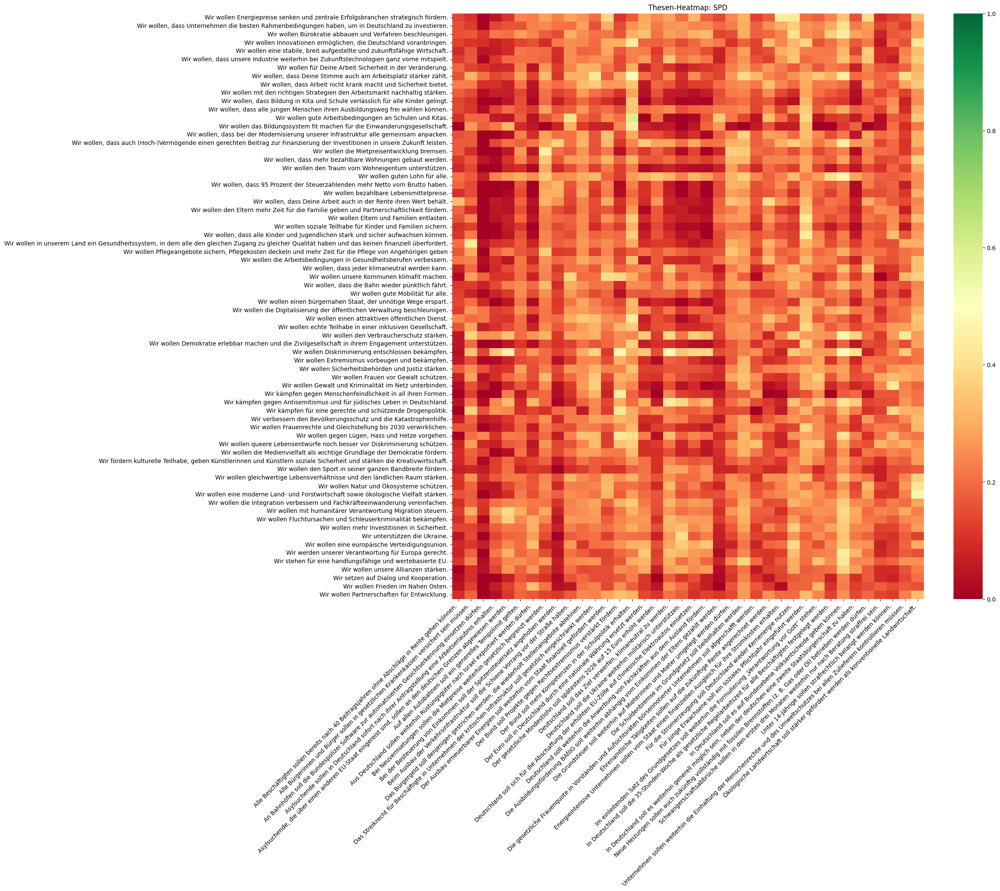

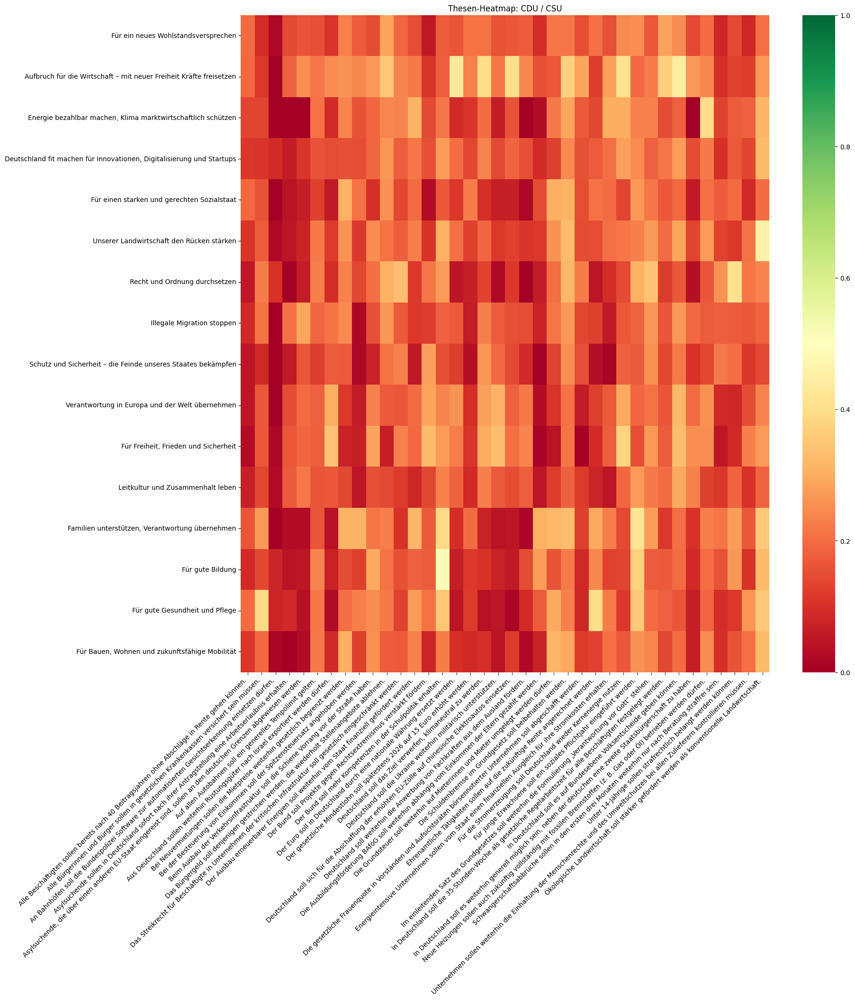

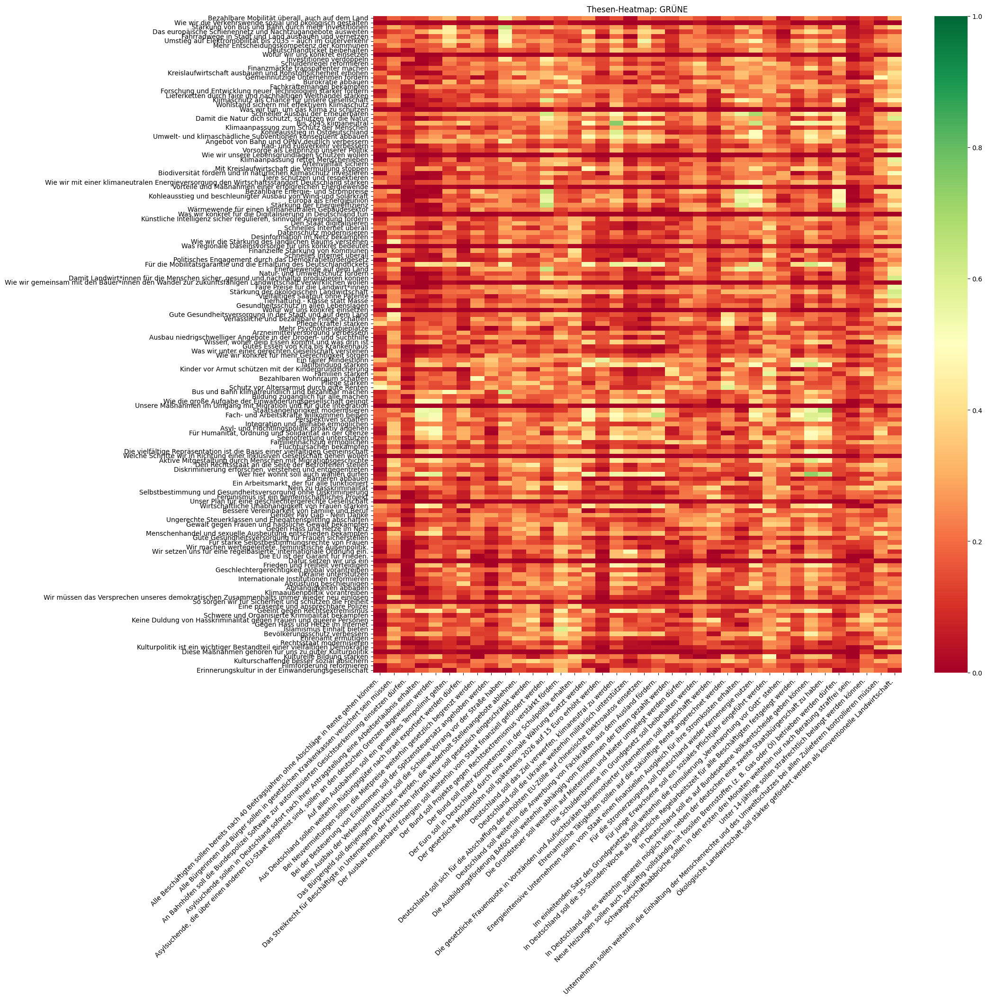

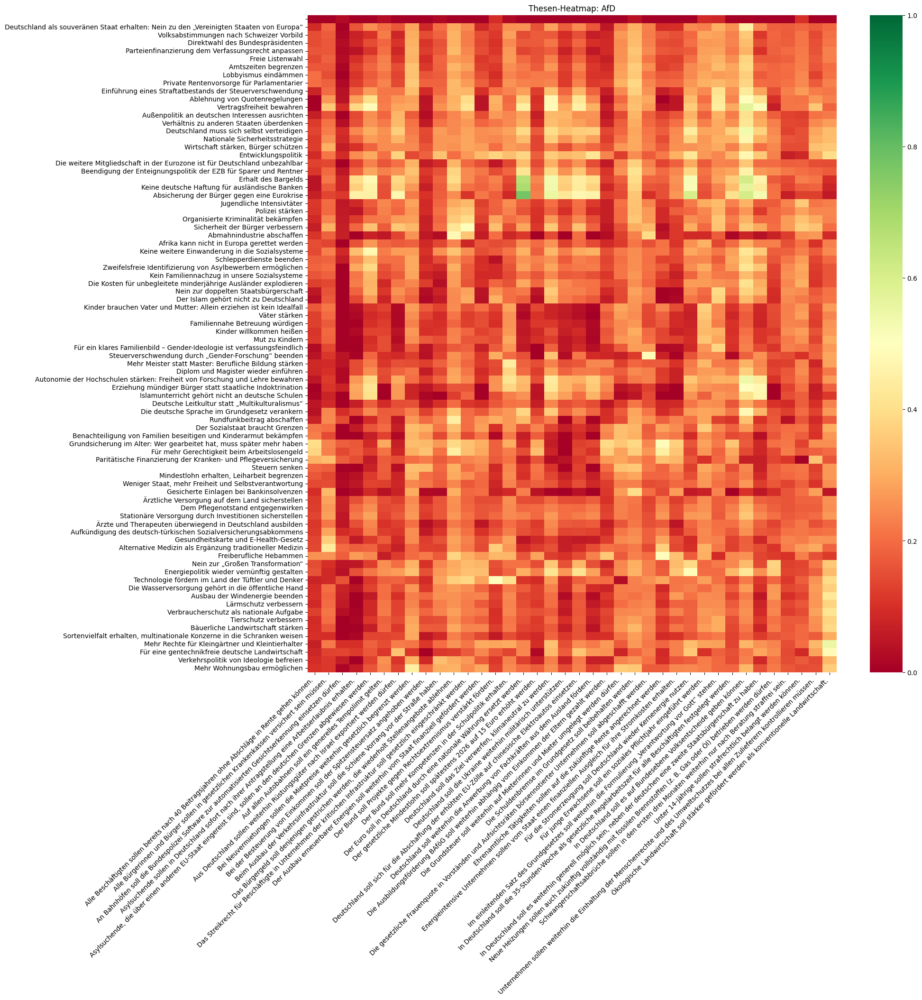

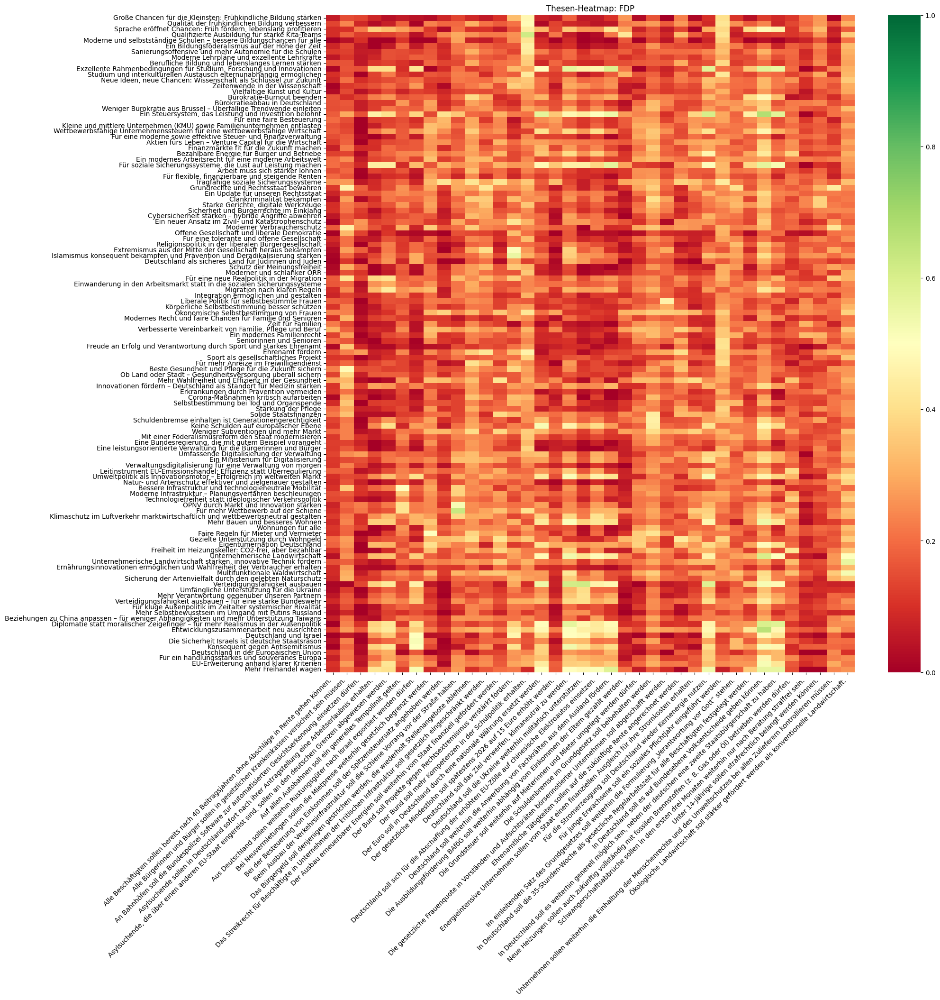

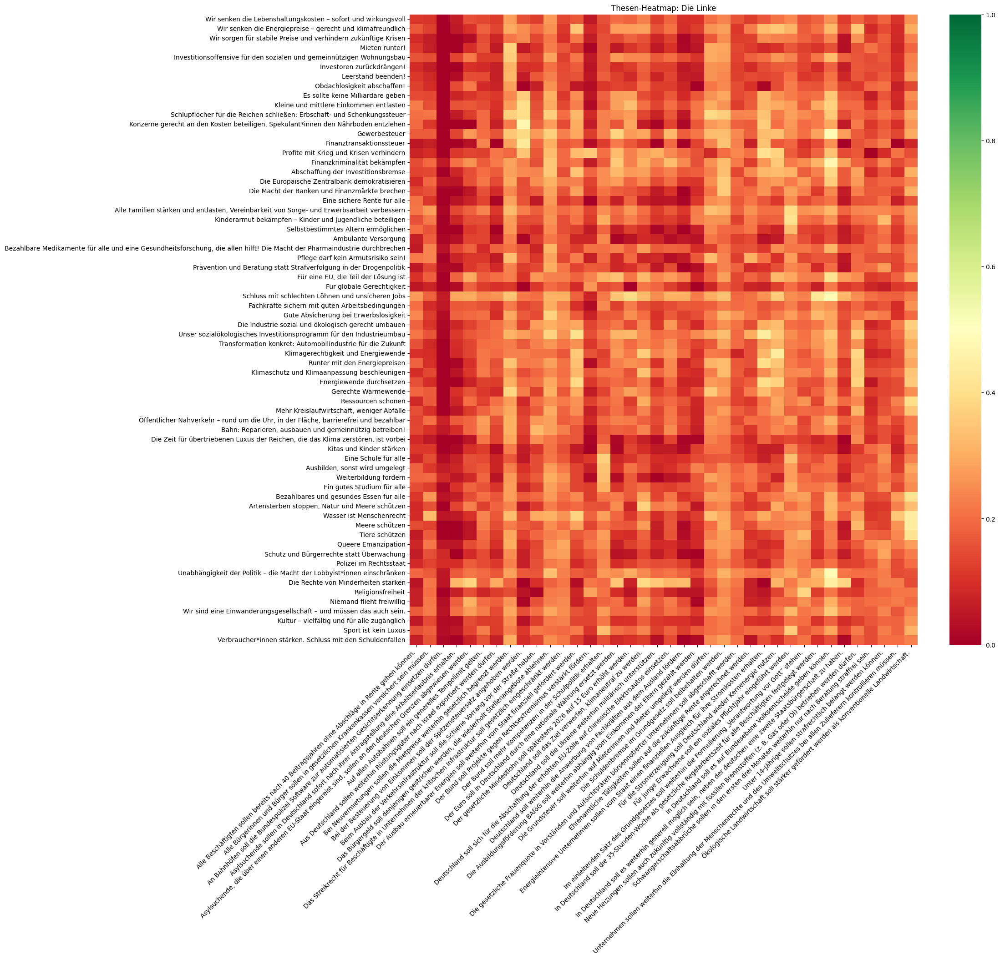

In [49]:
# Liste der Parteien und Thesen
parties_list = all_party_textes_df['Party'].unique().tolist()
Labled_theses_list = Labled_theses_df['These'].tolist()
predicted_these_text_dfs_dict = {}
predicted_these_text_df = predicted_theses_df.copy()

# Schleife über die Parteien
for party_str in parties_list:
    # Filtern der Daten für die aktuelle Partei
    party_df = all_party_textes_df[all_party_textes_df['Party'] == party_str]
    
    # Entfernen von Zeilen mit NaN-Werten
    party_df = party_df.dropna()
    
    # Extrahieren der Thesen für die aktuelle Partei
    party_text_list = (party_df['Text'] + ' ' + party_df['Text']).to_list()
    
    # Erstellung eines DataFrames zur Berechnung der Ähnlichkeiten
    similarity_df = pd.DataFrame(columns=['party_these'] + Labled_theses_list)

    # Berechnung der Ähnlichkeit für jede Partei-These
    for party_these in party_text_list:
        party_these_embedding = get_embedding(party_these)
        row = [party_these]

        # Berechnung der Kosinusähnlichkeit für jede labelte These
        for label_these in Labled_theses_list:
            label_these_embedding = get_embedding(label_these)
            similarity_score = (cosine_similarity(party_these_embedding.reshape(1, -1), label_these_embedding.reshape(1, -1))[0][0])
            row.append(similarity_score)

        similarity_df.loc[len(similarity_df)] = row

    # Visualisierung der Ähnlichkeiten als Heatmap
    plt.figure(figsize=(18, 18))
    sns.heatmap(similarity_df[Labled_theses_list],
                cmap='RdYlGn',
                annot=False,
                vmax=1,
                vmin=0,
                yticklabels=party_df['These']
                )
    plt.xticks(rotation=45, ha="right")
    plt.title(f"Thesen-Heatmap: {party_str}")
    plt.show()

    # Durchschnittliche Ähnlichkeit für jede Partei
    predicted_these_text_dfs_dict[party_str] = similarity_df
    predicted_these_text_df[party_str] = similarity_df[Labled_theses_list].max().tolist()
    

file_name_all_similaritys = f'paraphrase-multilingual-MiniLM-L12-v2_Theses_Text_all_similaritys.pkl' 
file_name_max_similaritys = f'paraphrase-multilingual-MiniLM-L12-v2_Theses_Text_max_similaritys.parquet' 


with open(file_name_all_similaritys, 'wb') as f:
    pickle.dump(predicted_these_text_dfs_dict, f)

predicted_these_text_df.to_parquet(file_name_max_similaritys, index=False)


In [54]:
calc_prediction_scores_func(predicted_these_text_df, label_these_num_df)

,score,CDU / CSU,GRÜNE,SPD,AfD,Die Linke,FDP
0,RMSE,0.389902,0.327552,0.346247,0.311688,0.346235,0.306570
1,MAE,0.342691,0.307234,0.317663,0.281251,0.310498,0.284484
2,R²,-0.495605,0.001898,-0.193907,-0.007626,-0.138848,0.027521


In [55]:
predicted_these_text_df

,These,CDU / CSU,GRÜNE,SPD,AfD,Die Linke,FDP
0,Alle Beschäftigten sollen bereits nach 40 Beit...,0.197280,0.500008,0.326008,0.398423,0.268547,0.306494
1,Alle Bürgerinnen und Bürger sollen in gesetzli...,0.390431,0.460823,0.430797,0.437154,0.325244,0.487329
2,An Bahnhöfen soll die Bundespolizei Software z...,0.104083,0.322967,0.251852,0.197439,0.094315,0.274307
3,Asylsuchende sollen in Deutschland sofort nach...,0.204273,0.556813,0.341139,0.453674,0.318338,0.453685
4,"Asylsuchende, die über einen anderen EU-Staat ...",0.287283,0.570393,0.445605,0.488124,0.378472,0.445961
5,Auf allen Autobahnen soll ein generelles Tempo...,0.237328,0.518605,0.299764,0.290325,0.276073,0.498351
6,Aus Deutschland sollen weiterhin Rüstungsgüter...,0.340289,0.432624,0.332886,0.470023,0.296665,0.522621
7,Bei Neuvermietungen sollen die Mietpreise weit...,0.310376,0.482463,0.447930,0.448431,0.379818,0.500345
8,Bei der Besteuerung von Einkommen soll der Spi...,0.309725,0.361109,0.370630,0.341633,0.469712,0.419132
9,Beim Ausbau der Verkehrsinfrastruktur soll die...,0.294518,0.635704,0.405744,0.343092,0.322955,0.629296


In [107]:
compare_df = pd.concat([predicted_these_text_df['These'], (predicted_these_text_df.select_dtypes(include='number')-label_these_num_df.select_dtypes(include='number'))], axis=1)

compare_df


,These,CDU / CSU,GRÜNE,SPD,AfD,Die Linke,FDP
0,Alle Beschäftigten sollen bereits nach 40 Beit...,0.030613,0.333341,0.159341,0.231756,-0.564786,0.139827
1,Alle Bürgerinnen und Bürger sollen in gesetzli...,0.223764,-0.372511,-0.402536,0.270487,-0.508090,0.320662
2,An Bahnhöfen soll die Bundespolizei Software z...,-0.729250,0.156300,0.085186,-0.635894,-0.072351,0.107640
3,Asylsuchende sollen in Deutschland sofort nach...,0.037606,-0.276520,-0.492194,0.287008,-0.514995,-0.046315
4,"Asylsuchende, die über einen anderen EU-Staat ...",-0.546051,0.403727,0.278938,-0.345210,0.211806,-0.387372
5,Auf allen Autobahnen soll ein generelles Tempo...,0.070661,-0.314728,-0.533569,0.123658,-0.557260,0.331684
6,Aus Deutschland sollen weiterhin Rüstungsgüter...,-0.493045,-0.400709,-0.500447,-0.029977,0.129999,-0.310712
7,Bei Neuvermietungen sollen die Mietpreise weit...,-0.522958,-0.350871,-0.385403,0.281764,-0.453516,0.333679
8,Bei der Besteuerung von Einkommen soll der Spi...,0.143059,-0.472224,-0.462703,0.174966,-0.363621,0.252465
9,Beim Ausbau der Verkehrsinfrastruktur soll die...,0.127851,-0.197629,-0.427590,0.176426,-0.510378,0.462629


In [106]:
compare_df.drop(columns='These').mean()

CDU / CSU   -0.195748
GRÜNE       -0.005942
SPD         -0.145566
AfD         -0.056185
Die Linke   -0.148214
FDP          0.027012
dtype: float64

In [100]:
compare_df.drop(columns='These').min().min()

np.float64(-0.7292503168185552)